In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
str_results = pd.read_csv("../run_all_models_scripts/structural_model_results.csv")
phy_results = pd.read_csv("../run_all_models_scripts/physicochemical_model_results.csv")
img_results = pd.read_csv("../run_all_models_scripts/cellpainting_model_results.csv")
ge_results = pd.read_csv("../run_all_models_scripts/LINCSL1000_model_results.csv")
go_results = pd.read_csv("../run_all_models_scripts/GO_model_results.csv")
pid_results = pd.read_csv("../run_all_models_scripts/CellScape_model_results.csv") 
pid_cmu_results = pd.read_csv("../run_all_models_scripts/CellScape_Cmax_unbound_model_results.csv") 
pid_cmt_results = pd.read_csv("../run_all_models_scripts/CellScape_Cmax_total_model_results.csv") 
moa_results = pd.read_csv("../run_all_models_scripts/MOA_model_results.csv") 
moa_cmu_results = pd.read_csv("../run_all_models_scripts/MOA_Cmax_unbound_model_results.csv") 
moa_cmt_results = pd.read_csv("../run_all_models_scripts/MOA_Cmax_total_model_results.csv") 


#str_results = pd.read_csv("../03_Structural_models/structural_model_results.csv")
#phy_results = pd.read_csv("../04_Physicochemical_models/physicochemical_model_results.csv")
#img_results = pd.read_csv("../05_Cell_Painting_models/cellpainting_model_results.csv")
#ge_results = pd.read_csv("../06_LINCSL1000_models/LINCSL1000_model_results.csv")
#go_results = pd.read_csv("../07_GO_models/GO_model_results.csv")
#pid_results = pd.read_csv("../08_PIDGINv4_models/PIDGINv4_model_results.csv") 
#moa_results = pd.read_csv("../09_MOA_models/MOA_model_results.csv") 

In [3]:
ensemble_all_results = pd.read_csv("./Ensemble_all_model_results.csv") 
ensemble_selected_results = pd.read_csv("./Ensemble_selected_model_results.csv") 

In [4]:
str_results

,endpoint,CV_AUC_mean,CV_AUC_std,Held_out_TP,Held_out_TN,Held_out_FP,Held_out_FN,Held_out_BA,Held_out_AUC,Held_out_MCC,Held_out_AUCPR,Held_out_Specificity,Held_out_Sensitivity,Held_out_F1
0,Cardiotox (with SIDER inactives),0.692812,0.018045,44.0,17.0,8.0,21.0,0.678462,0.722462,0.323674,0.857987,0.68,0.676923,0.752137
1,Cardiotox (with SIDER actives),0.676705,0.024346,42.0,17.0,8.0,23.0,0.663077,0.736000,0.293991,0.873783,0.68,0.646154,0.730435
2,Cardiotox (with SIDER all),0.682586,0.012660,36.0,18.0,7.0,29.0,0.636923,0.737231,0.245556,0.873420,0.72,0.553846,0.666667
3,Cardiac disorders,0.682941,0.034613,60.0,24.0,16.0,33.0,0.622581,0.674194,0.227185,0.822359,0.60,0.645161,0.710059
4,DICTrank,0.638723,0.038158,46.0,17.0,8.0,19.0,0.693846,0.758769,0.354459,0.878004,0.68,0.707692,0.773109


In [5]:
moa_results

,endpoint,CV_AUC_mean,CV_AUC_std,Held_out_TP,Held_out_TN,Held_out_FP,Held_out_FN,Held_out_BA,Held_out_AUC,Held_out_MCC,Held_out_AUCPR,Held_out_Specificity,Held_out_Sensitivity,Held_out_F1
0,Cardiotox (with SIDER inactives),0.676977,0.056203,44.0,20.0,5.0,21.0,0.738462,0.743077,0.428929,0.897620,0.800000,0.676923,0.771930
1,Cardiotox (with SIDER actives),0.671138,0.037717,40.0,20.0,5.0,25.0,0.707692,0.820308,0.372104,0.919293,0.800000,0.615385,0.727273
2,Cardiotox (with SIDER all),0.645471,0.022831,33.0,23.0,2.0,32.0,0.713846,0.783385,0.392955,0.909714,0.920000,0.507692,0.660000
3,Cardiac disorders,0.700730,0.030117,35.0,32.0,3.0,41.0,0.687406,0.716541,0.367030,0.841436,0.914286,0.460526,0.614035
4,DICTrank,0.672815,0.027227,44.0,20.0,5.0,21.0,0.738462,0.801846,0.428929,0.913099,0.800000,0.676923,0.771930


In [6]:
phy_results

,endpoint,CV_AUC_mean,CV_AUC_std,Held_out_TP,Held_out_TN,Held_out_FP,Held_out_FN,Held_out_BA,Held_out_AUC,Held_out_MCC,Held_out_AUCPR,Held_out_Specificity,Held_out_Sensitivity,Held_out_F1
0,Cardiotox (with SIDER inactives),0.696070,0.030960,51.0,17.0,8.0,14.0,0.732308,0.804308,0.437939,0.904989,0.68,0.784615,0.822581
1,Cardiotox (with SIDER actives),0.703112,0.029853,56.0,9.0,16.0,9.0,0.610769,0.753846,0.248069,0.893506,0.36,0.861538,0.817518
2,Cardiotox (with SIDER all),0.691032,0.019467,42.0,22.0,3.0,23.0,0.763077,0.814154,0.471332,0.917522,0.88,0.646154,0.763636
3,Cardiac disorders,0.705656,0.028494,70.0,18.0,22.0,23.0,0.601344,0.706989,0.201286,0.849066,0.45,0.752688,0.756757
4,DICTrank,0.698334,0.064899,56.0,13.0,12.0,9.0,0.690769,0.840615,0.397648,0.932518,0.52,0.861538,0.842105


In [7]:
img_results

,endpoint,CV_AUC_mean,CV_AUC_std,Held_out_TP,Held_out_TN,Held_out_FP,Held_out_FN,Held_out_BA,Held_out_AUC,Held_out_MCC,Held_out_AUCPR,Held_out_Specificity,Held_out_Sensitivity,Held_out_F1
0,Cardiotox (with SIDER inactives),0.600325,0.085673,62.0,3.0,22.0,3.0,0.536923,0.616000,0.132599,0.799524,0.120000,0.953846,0.832215
1,Cardiotox (with SIDER actives),0.309673,0.129179,0.0,25.0,0.0,65.0,0.500000,0.544000,0.000000,0.763938,1.000000,0.000000,0.000000
2,Cardiotox (with SIDER all),0.594173,0.005987,62.0,1.0,24.0,3.0,0.496923,0.608615,-0.013375,0.809996,0.040000,0.953846,0.821192
3,Cardiac disorders,0.651810,0.041776,36.0,6.0,5.0,5.0,0.711752,0.811530,0.423503,0.946832,0.545455,0.878049,0.878049
4,DICTrank,0.364048,0.084694,60.0,2.0,23.0,5.0,0.501538,0.518769,0.005146,0.713542,0.080000,0.923077,0.810811


In [8]:
ge_results

,endpoint,CV_AUC_mean,CV_AUC_std,Held_out_TP,Held_out_TN,Held_out_FP,Held_out_FN,Held_out_BA,Held_out_AUC,Held_out_MCC,Held_out_AUCPR,Held_out_Specificity,Held_out_Sensitivity,Held_out_F1
0,Cardiotox (with SIDER inactives),0.604632,0.060971,57.0,5.0,20.0,8.0,0.538462,0.616000,0.098009,0.797242,0.200000,0.876923,0.802817
1,Cardiotox (with SIDER actives),0.567697,0.044278,28.0,15.0,10.0,37.0,0.515385,0.588923,0.027903,0.816574,0.600000,0.430769,0.543689
2,Cardiotox (with SIDER all),0.577177,0.031213,52.0,10.0,15.0,13.0,0.600000,0.606769,0.205379,0.801583,0.400000,0.800000,0.787879
3,Cardiac disorders,0.560207,0.066801,47.0,7.0,16.0,16.0,0.525190,0.521739,0.050380,0.760458,0.304348,0.746032,0.746032
4,DICTrank,0.554239,0.020214,28.0,16.0,9.0,37.0,0.535385,0.566769,0.064422,0.768267,0.640000,0.430769,0.549020


In [9]:
go_results

,endpoint,CV_AUC_mean,CV_AUC_std,Held_out_TP,Held_out_TN,Held_out_FP,Held_out_FN,Held_out_BA,Held_out_AUC,Held_out_MCC,Held_out_AUCPR,Held_out_Specificity,Held_out_Sensitivity,Held_out_F1
0,Cardiotox (with SIDER inactives),0.553192,0.073399,61.0,4.0,21.0,4.0,0.549231,0.609231,0.154968,0.768785,0.160000,0.938462,0.829932
1,Cardiotox (with SIDER actives),0.558737,0.054193,12.0,21.0,4.0,53.0,0.512308,0.521846,0.028837,0.768044,0.840000,0.184615,0.296296
2,Cardiotox (with SIDER all),0.565123,0.034646,23.0,19.0,6.0,42.0,0.556923,0.590769,0.109114,0.773929,0.760000,0.353846,0.489362
3,Cardiac disorders,0.527008,0.024574,54.0,2.0,21.0,9.0,0.472050,0.536232,-0.074084,0.772770,0.086957,0.857143,0.782609
4,DICTrank,0.545077,0.025562,43.0,8.0,17.0,22.0,0.490769,0.459077,-0.017541,0.720432,0.320000,0.661538,0.688000


In [10]:
ensemble_all_results

,endpoint,Held_out_TP,Held_out_TN,Held_out_FP,Held_out_FN,Held_out_BA,Held_out_AUC,Held_out_MCC,Held_out_AUCPR,Held_out_Specificity,Held_out_Sensitivity,Held_out_F1
0,Cardiotox (with SIDER inactives),46.0,13.0,8.0,11.0,0.713033,0.805347,0.409469,0.919904,0.619048,0.807018,0.828829
1,Cardiotox (with SIDER all),45.0,13.0,8.0,12.0,0.704261,0.832080,0.388288,0.933899,0.619048,0.789474,0.818182
2,Cardiotox (with SIDER actives),47.0,12.0,9.0,10.0,0.697995,0.825397,0.390325,0.930765,0.571429,0.824561,0.831858
3,DICTrank,51.0,10.0,11.0,6.0,0.685464,0.830409,0.407455,0.934383,0.476190,0.894737,0.857143


In [11]:
ensemble_selected_results

,endpoint,Held_out_TP,Held_out_TN,Held_out_FP,Held_out_FN,Held_out_BA,Held_out_AUC,Held_out_MCC,Held_out_AUCPR,Held_out_Specificity,Held_out_Sensitivity,Held_out_F1
0,Cardiac disorders,69.0,23.0,17.0,24.0,0.658468,0.718817,0.304049,0.863481,0.575,0.741935,0.770950
1,Cardiotox (with SIDER inactives),46.0,19.0,6.0,19.0,0.733846,0.788308,0.424125,0.909336,0.760,0.707692,0.786325
2,Cardiotox (with SIDER all),41.0,21.0,4.0,24.0,0.735385,0.791385,0.421718,0.912928,0.840,0.630769,0.745455
3,Cardiotox (with SIDER actives),55.0,11.0,14.0,10.0,0.643077,0.800615,0.303035,0.915569,0.440,0.846154,0.820896
4,DICTrank,56.0,13.0,12.0,9.0,0.690769,0.827692,0.397648,0.925051,0.520,0.861538,0.842105


In [12]:
# Rename columns with 'atr_' and 'img_'
str_results = str_results.rename(columns=lambda x: 'str_' + x if x != str_results.columns[0] else x)
phy_results = phy_results.rename(columns=lambda x: 'phy_' + x if x != phy_results.columns[0] else x)
img_results = img_results.rename(columns=lambda x: 'img_' + x if x != img_results.columns[0] else x)
ge_results = ge_results.rename(columns=lambda x: 'ge_' + x if x != ge_results.columns[0] else x)
go_results = go_results.rename(columns=lambda x: 'go_' + x if x != ge_results.columns[0] else x)

pid_results = pid_results.rename(columns=lambda x: 'pid_' + x if x != pid_results.columns[0] else x)
pid_cmt_results = pid_cmt_results.rename(columns=lambda x: 'pid_cmt_' + x if x != pid_cmt_results.columns[0] else x)
pid_cmu_results = pid_cmu_results.rename(columns=lambda x: 'pid_cmu_' + x if x != pid_cmu_results.columns[0] else x)

moa_cmt_results = moa_cmt_results.rename(columns=lambda x: 'moa_cmt_' + x if x != moa_cmt_results.columns[0] else x)
moa_cmu_results = moa_cmu_results.rename(columns=lambda x: 'moa_cmu_' + x if x != moa_cmu_results.columns[0] else x)
moa_results = moa_results.rename(columns=lambda x: 'moa_' + x if x != moa_results.columns[0] else x)


ensemble_all_results = ensemble_all_results.rename(columns=lambda x: 'esnemble_all_' + x if x != ensemble_all_results.columns[0] else x)
ensemble_selected_results = ensemble_selected_results.rename(columns=lambda x: 'esnemble_selected_' + x if x != ensemble_selected_results.columns[0] else x)

In [13]:
# Merge the DataFrames on the first column (assuming it's a common identifier)
merged_df = pd.merge(str_results, phy_results, on="endpoint", suffixes=('_str', '_phy'))
merged_df = pd.merge(merged_df, img_results, on="endpoint", suffixes=('', '_img'))
merged_df = pd.merge(merged_df, ge_results, on="endpoint", suffixes=('', '_ge'))
merged_df = pd.merge(merged_df, go_results, on="endpoint", suffixes=('', '_go'))
merged_df = pd.merge(merged_df, pid_results, on="endpoint", suffixes=('', '_pid'))
merged_df = pd.merge(merged_df, pid_cmt_results, on="endpoint", suffixes=('', '_pid_cmt'))
merged_df = pd.merge(merged_df, pid_cmu_results, on="endpoint", suffixes=('', '_pid_cmu'))
merged_df = pd.merge(merged_df, moa_results, on="endpoint", suffixes=('', '_moa'))
merged_df = pd.merge(merged_df, moa_cmt_results, on="endpoint", suffixes=('', '_moa_cmt'))
merged_df = pd.merge(merged_df, moa_cmu_results, on="endpoint", suffixes=('', '_moa_cmu'))
merged_df = pd.merge(merged_df, ensemble_all_results, on="endpoint", suffixes=('', '_esnemble_all'))
results_df = pd.merge(merged_df, ensemble_selected_results, on="endpoint", suffixes=('', '_esnemble_selected'))

results_df.to_csv("results_df_all_scores.csv", index=False)
results_df

results_df=results_df[results_df["endpoint"]!="Cardiac disorders"]


In [14]:
results_df

,endpoint,str_CV_AUC_mean,str_CV_AUC_std,str_Held_out_TP,str_Held_out_TN,str_Held_out_FP,str_Held_out_FN,str_Held_out_BA,str_Held_out_AUC,str_Held_out_MCC,...,esnemble_selected_Held_out_TN,esnemble_selected_Held_out_FP,esnemble_selected_Held_out_FN,esnemble_selected_Held_out_BA,esnemble_selected_Held_out_AUC,esnemble_selected_Held_out_MCC,esnemble_selected_Held_out_AUCPR,esnemble_selected_Held_out_Specificity,esnemble_selected_Held_out_Sensitivity,esnemble_selected_Held_out_F1
0,Cardiotox (with SIDER inactives),0.692812,0.018045,44.0,17.0,8.0,21.0,0.678462,0.722462,0.323674,...,19.0,6.0,19.0,0.733846,0.788308,0.424125,0.909336,0.76,0.707692,0.786325
1,Cardiotox (with SIDER actives),0.676705,0.024346,42.0,17.0,8.0,23.0,0.663077,0.736000,0.293991,...,11.0,14.0,10.0,0.643077,0.800615,0.303035,0.915569,0.44,0.846154,0.820896
2,Cardiotox (with SIDER all),0.682586,0.012660,36.0,18.0,7.0,29.0,0.636923,0.737231,0.245556,...,21.0,4.0,24.0,0.735385,0.791385,0.421718,0.912928,0.84,0.630769,0.745455
3,DICTrank,0.638723,0.038158,46.0,17.0,8.0,19.0,0.693846,0.758769,0.354459,...,13.0,12.0,9.0,0.690769,0.827692,0.397648,0.925051,0.52,0.861538,0.842105


In [15]:
# Define a list of tasks
tasks = ['phy', 'str', 'pid', 'moa', 'img', 'ge', 'go', "pid_cmt", "moa_cmt", "pid_cmu", "moa_cmu"]
endpoints = results_df.endpoint.unique()

# Create an empty dictionary to store the lists of models for each task
model_lists = {}

# Iterate through each endpoint
for endpoint in endpoints:
    # Create a dictionary to store lists of models for each task
    endpoint_model_lists = {}
    
    # Iterate through each task
    for task in tasks:
        # Create a boolean mask for the specified metric and task
        auc_column = f'{task}_CV_AUC_mean'
        mask = results_df[results_df['endpoint'] == endpoint][auc_column] > 0.65
        
        # Filter the DataFrame based on the mask and select the model names
        models_for_task = results_df[results_df['endpoint'] == endpoint][mask].index.tolist()

        # Store the list of models for the current task
        endpoint_model_lists[task] = models_for_task

    # Store the endpoint-specific model lists in the main dictionary
    model_lists[endpoint] = endpoint_model_lists

# Now, the model_lists dictionary contains lists of models for each task for each endpoint
model_lists


{'Cardiotox (with SIDER inactives)': {'phy': [0],
  'str': [0],
  'pid': [0],
  'moa': [0],
  'img': [],
  'ge': [],
  'go': [],
  'pid_cmt': [0],
  'moa_cmt': [0],
  'pid_cmu': [0],
  'moa_cmu': []},
 'Cardiotox (with SIDER actives)': {'phy': [1],
  'str': [1],
  'pid': [1],
  'moa': [1],
  'img': [],
  'ge': [],
  'go': [],
  'pid_cmt': [1],
  'moa_cmt': [1],
  'pid_cmu': [1],
  'moa_cmu': [1]},
 'Cardiotox (with SIDER all)': {'phy': [2],
  'str': [2],
  'pid': [2],
  'moa': [],
  'img': [],
  'ge': [],
  'go': [],
  'pid_cmt': [2],
  'moa_cmt': [2],
  'pid_cmu': [2],
  'moa_cmu': [2]},
 'DICTrank': {'phy': [3],
  'str': [],
  'pid': [3],
  'moa': [3],
  'img': [],
  'ge': [],
  'go': [],
  'pid_cmt': [3],
  'moa_cmt': [3],
  'pid_cmu': [3],
  'moa_cmu': [3]}}

In [16]:
import pickle

pickle_file_path = '../01_standardise_datasets/activity_columns_mapping_selected.pkl'

# Loading the dictionary
with open(pickle_file_path, 'rb') as file:
    activity_columns_mapping = pickle.load(file)

In [17]:
def map_to_group(endpoint):
    for group, endpoints in activity_columns_mapping.items():
        if endpoint in endpoints:
            return group
    return 'Other'  # A default group if not found in the mapping

# Add a new column 'Mapping_Group' based on 'Endpoint'
results_df['Task'] = results_df['endpoint'].apply(lambda x: map_to_group(x))
results_df

,endpoint,str_CV_AUC_mean,str_CV_AUC_std,str_Held_out_TP,str_Held_out_TN,str_Held_out_FP,str_Held_out_FN,str_Held_out_BA,str_Held_out_AUC,str_Held_out_MCC,...,esnemble_selected_Held_out_FP,esnemble_selected_Held_out_FN,esnemble_selected_Held_out_BA,esnemble_selected_Held_out_AUC,esnemble_selected_Held_out_MCC,esnemble_selected_Held_out_AUCPR,esnemble_selected_Held_out_Specificity,esnemble_selected_Held_out_Sensitivity,esnemble_selected_Held_out_F1,Task
0,Cardiotox (with SIDER inactives),0.692812,0.018045,44.0,17.0,8.0,21.0,0.678462,0.722462,0.323674,...,6.0,19.0,0.733846,0.788308,0.424125,0.909336,0.76,0.707692,0.786325,cardiotox_with_sider_inactives
1,Cardiotox (with SIDER actives),0.676705,0.024346,42.0,17.0,8.0,23.0,0.663077,0.736000,0.293991,...,14.0,10.0,0.643077,0.800615,0.303035,0.915569,0.44,0.846154,0.820896,cardiotox_with_sider_actives
2,Cardiotox (with SIDER all),0.682586,0.012660,36.0,18.0,7.0,29.0,0.636923,0.737231,0.245556,...,4.0,24.0,0.735385,0.791385,0.421718,0.912928,0.84,0.630769,0.745455,cardiotox_with_sider_all
3,DICTrank,0.638723,0.038158,46.0,17.0,8.0,19.0,0.693846,0.758769,0.354459,...,12.0,9.0,0.690769,0.827692,0.397648,0.925051,0.52,0.861538,0.842105,DICTrank


In [18]:
results_df.columns

Index(['endpoint', 'str_CV_AUC_mean', 'str_CV_AUC_std', 'str_Held_out_TP',
       'str_Held_out_TN', 'str_Held_out_FP', 'str_Held_out_FN',
       'str_Held_out_BA', 'str_Held_out_AUC', 'str_Held_out_MCC',
       ...
       'esnemble_selected_Held_out_FP', 'esnemble_selected_Held_out_FN',
       'esnemble_selected_Held_out_BA', 'esnemble_selected_Held_out_AUC',
       'esnemble_selected_Held_out_MCC', 'esnemble_selected_Held_out_AUCPR',
       'esnemble_selected_Held_out_Specificity',
       'esnemble_selected_Held_out_Sensitivity',
       'esnemble_selected_Held_out_F1', 'Task'],
      dtype='object', length=167)

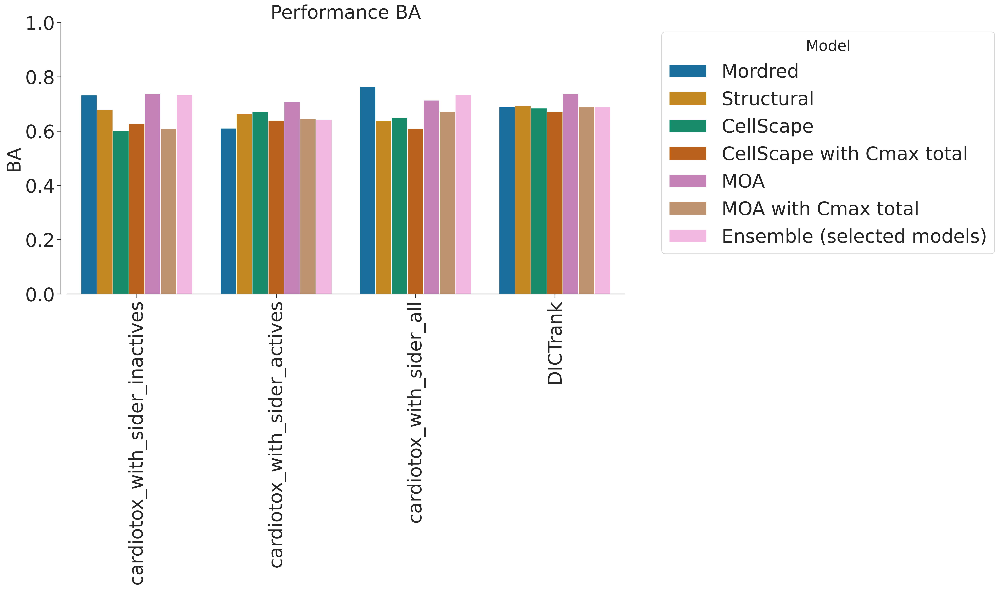

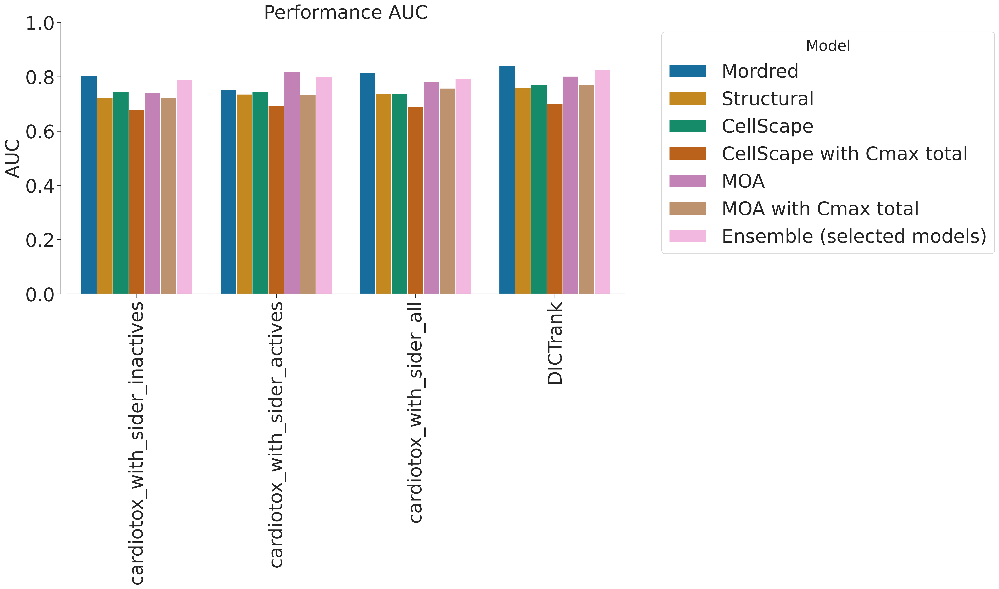

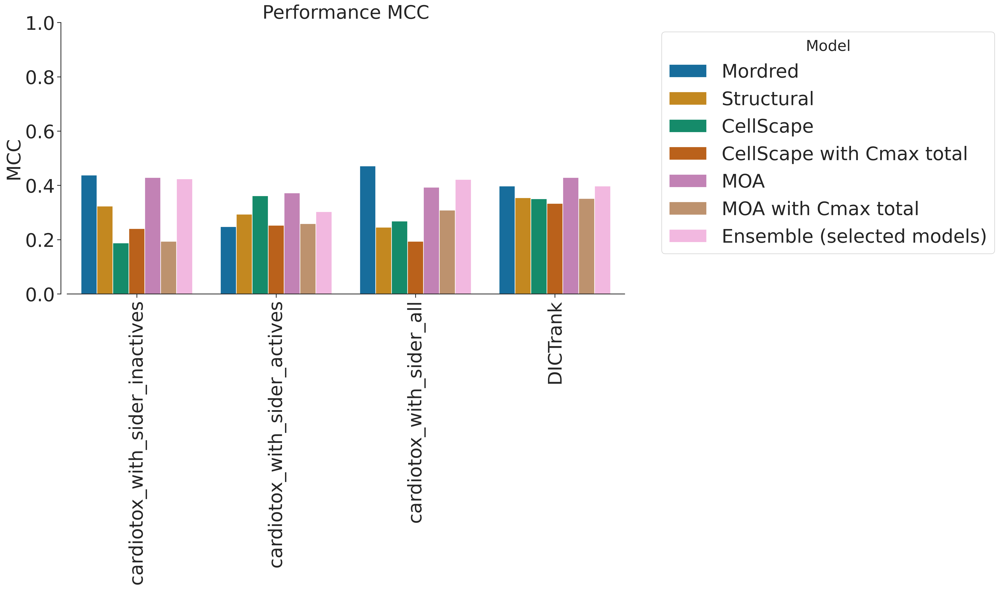

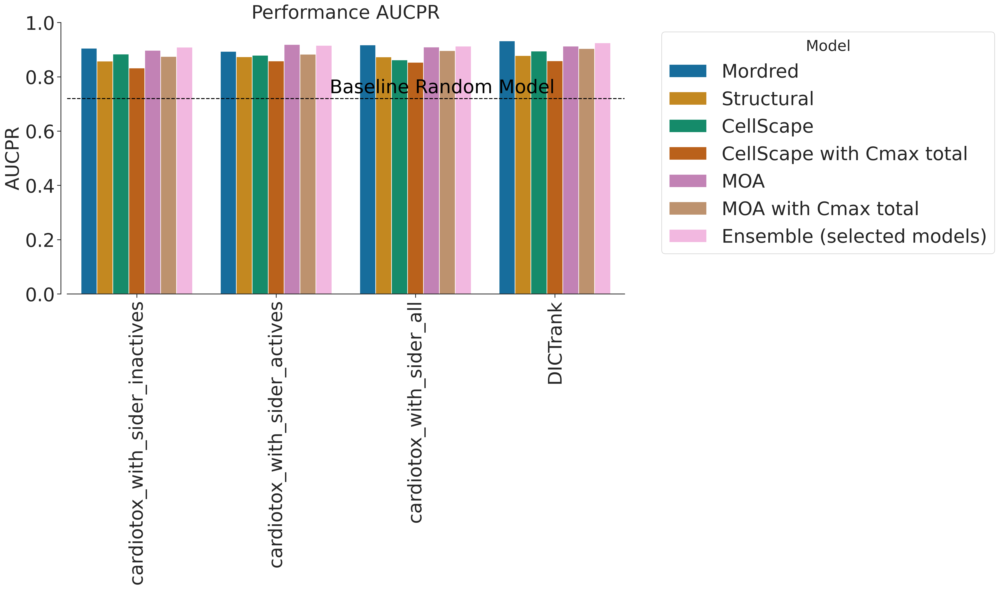

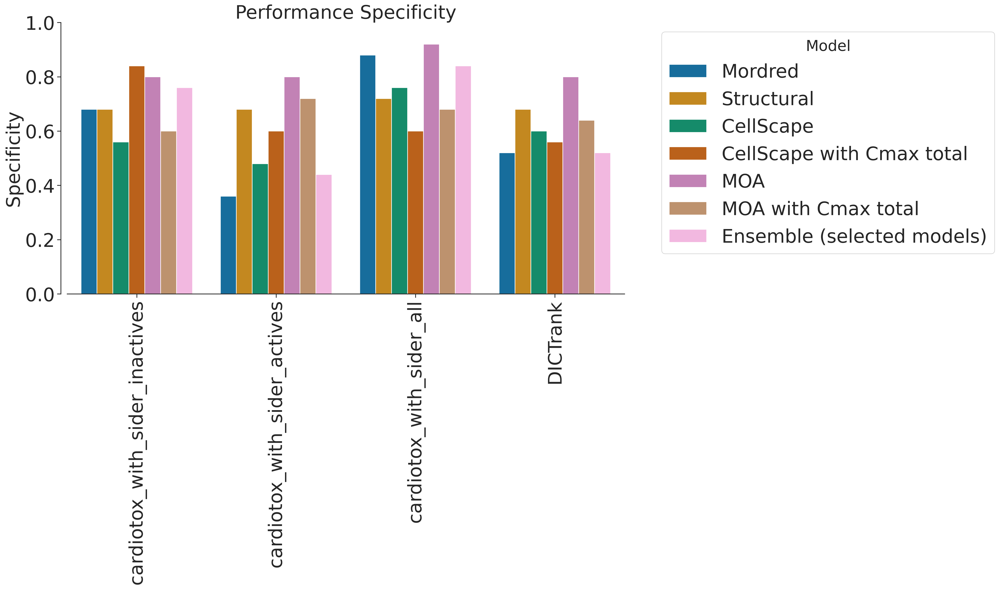

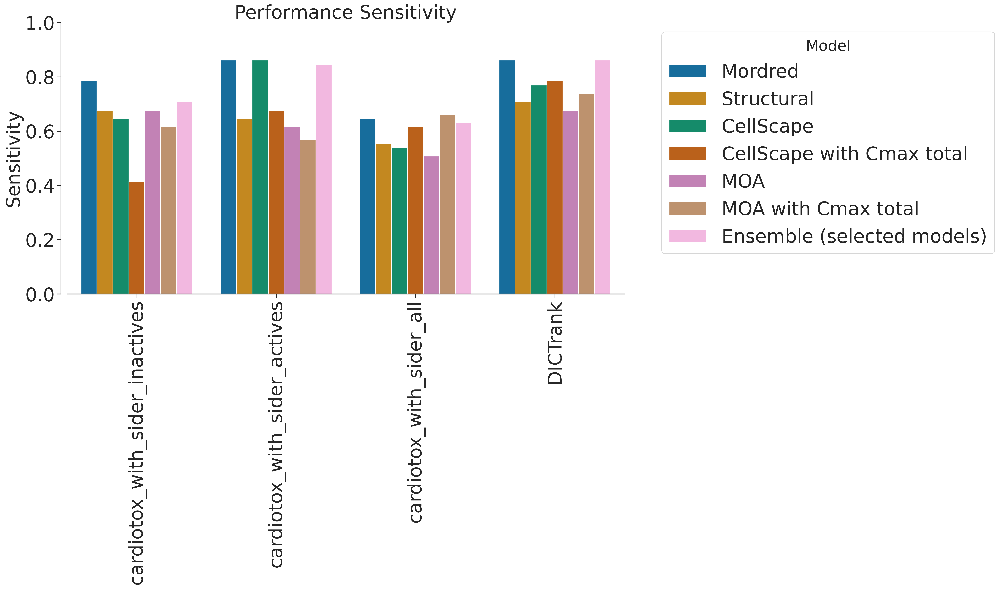

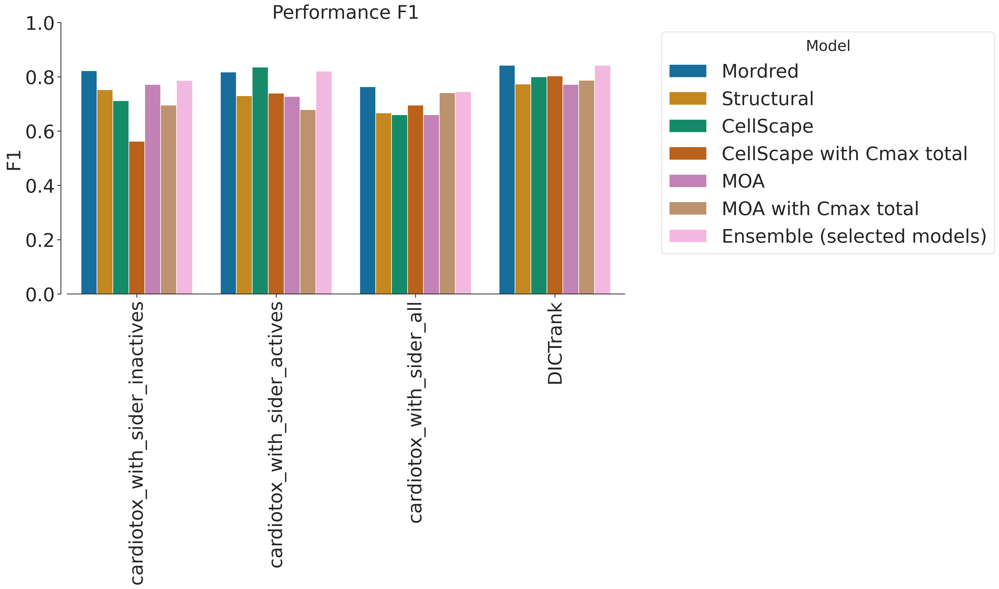

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the list of metrics to plot
metrics_to_plot = ['BA', 'AUC', 'MCC', 'AUCPR', 'Specificity', 'Sensitivity', "F1"]

# Set the width for grouped bars
width = 0.2

# Set a colorblind-friendly palette
colors = sns.color_palette("colorblind")

# Loop through each metric and create a grouped bar plot
for metric in metrics_to_plot:
    
    # Create a figure and axis using Seaborn
    plt.figure(figsize=(16, 8), dpi=300) 
    sns.set(style="white", font_scale=2) # Set the style

    metric_data = results_df[[f'phy_Held_out_{metric}', 
                              f'str_Held_out_{metric}', 
                              f'pid_Held_out_{metric}',
                              f'pid_cmt_Held_out_{metric}',
                              f'moa_Held_out_{metric}',
                              f'moa_cmt_Held_out_{metric}',
                              f'esnemble_selected_Held_out_{metric}',
                              'Task']]
    
    metric_data.columns = ["Mordred", "Structural", "CellScape", "CellScape with Cmax total",
                           "MOA", "MOA with Cmax total",
                           "Ensemble (selected models)",  "Task"]

    # Melt the DataFrame to use 'hue' for differentiation
    melted_data = metric_data.reset_index().melt(id_vars='Task', 
                                            value_vars=["Mordred", 
                                                        "Structural", 
                                                        "CellScape", 
                                                        "CellScape with Cmax total",
                                                        "MOA", 
                                                        "MOA with Cmax total",
                                                        "Ensemble (selected models)"
                                                       ], 
                                            var_name='Metric', 
                                            value_name='Median Metric')
    # Create the grouped bar plot
    ax = sns.barplot(data=melted_data, x='Task', y='Median Metric', 
                hue='Metric', ci="sd", palette=colors, errcolor='black', 
                     errwidth=2, capsize=0.1) 
    
    if (metric == "AUCPR"):     
        # Insert a dashed line at y=0.72
        ax.axhline(0.72, color='black', linestyle='--')

        # Add a label on top of the dashed line
        x_max = melted_data['Task'].nunique() - 1  # This assumes equally spaced x-ticks
        ax.text(x_max, 0.72 + 0.02, 'Baseline Random Model', horizontalalignment='right', 
                color='black', 
                fontsize=30)


    
    
    # Set labels and title
    ax.set_ylabel(f'{metric}', fontsize=30)
    ax.set_title(f'Performance {metric}', fontsize=30)
    
    # Set x-axis ticks and labels with rotation, increased fontsize
    x_ticks = range(len(melted_data['Task'].unique()))
    x_labels = melted_data['Task'].unique()
    ax.set_xticklabels(x_labels, rotation=90, fontsize=30)  # Adjust rotation angle and fontsize
    ax.tick_params(axis='y', labelsize=30)
    
    # Add legend outside the box, on the upper right
    ax.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=30)

    # Remove box line, set y-axis on the left, and add a line on the x-axis
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

    # Ensure the bars sit on the x-axis
    ax.set_ylim(top=1.0)
    
    # Remove x-axis label
    ax.set_xlabel('')

    # Show the plot
    plt.savefig(f'{metric}_barplot_comparison.png', bbox_inches='tight')
    plt.show()

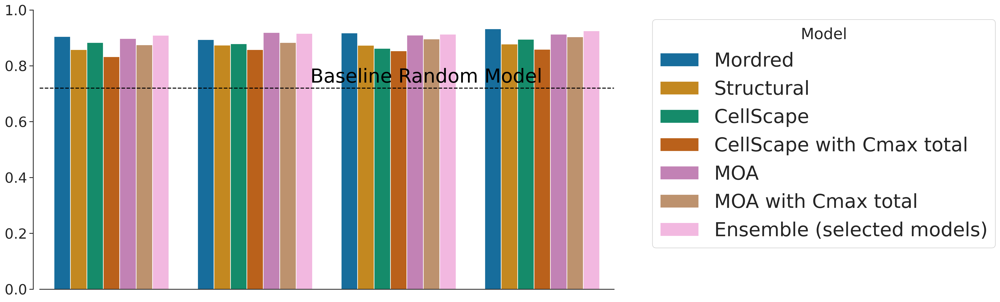

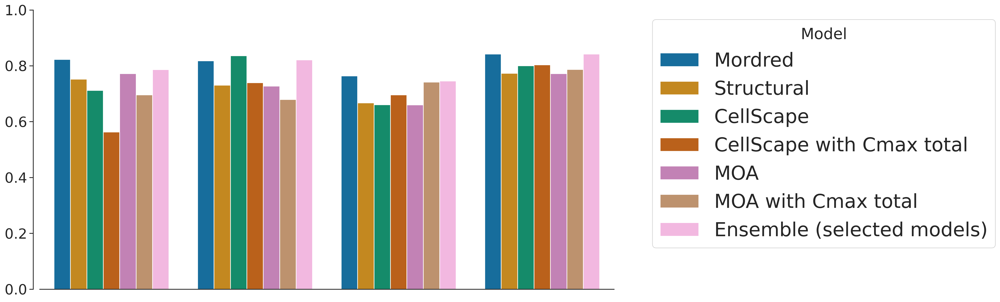

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the list of metrics to plot
metrics_to_plot = ['AUCPR',"F1"]

# Set the width for grouped bars
width = 0.2

# Set a colorblind-friendly palette
colors = sns.color_palette("colorblind")

# Loop through each metric and create a grouped bar plot
for metric in metrics_to_plot:
    
    # Create a figure and axis using Seaborn
    plt.figure(figsize=(16, 8), dpi=300) 
    sns.set(style="white", font_scale=2) # Set the style

    metric_data = results_df[[f'phy_Held_out_{metric}', 
                              f'str_Held_out_{metric}', 
                              f'pid_Held_out_{metric}',
                              f'pid_cmt_Held_out_{metric}',
                              f'moa_Held_out_{metric}',
                              f'moa_cmt_Held_out_{metric}',
                              f'esnemble_selected_Held_out_{metric}',
                              'Task']]
    
    metric_data.columns = ["Mordred", "Structural", "CellScape", "CellScape with Cmax total",
                           "MOA", "MOA with Cmax total",
                           "Ensemble (selected models)",  "Task"]

    # Melt the DataFrame to use 'hue' for differentiation
    melted_data = metric_data.reset_index().melt(id_vars='Task', 
                                            value_vars=["Mordred", 
                                                        "Structural", 
                                                        "CellScape", 
                                                        "CellScape with Cmax total",
                                                        "MOA", 
                                                        "MOA with Cmax total",
                                                        "Ensemble (selected models)"
                                                       ], 
                                            var_name='Metric', 
                                            value_name='Median Metric')
    # Create the grouped bar plot
    ax = sns.barplot(data=melted_data, x='Task', y='Median Metric', 
                hue='Metric', ci="sd", palette=colors, errcolor='black', 
                     errwidth=2, capsize=0.1) 
    
    if (metric == "AUCPR"):     
        # Insert a dashed line at y=0.72
        ax.axhline(0.72, color='black', linestyle='--')

        # Add a label on top of the dashed line
        x_max = melted_data['Task'].nunique() - 1  # This assumes equally spaced x-ticks
        ax.text(x_max, 0.72 + 0.02, 'Baseline Random Model', horizontalalignment='right', 
                color='black', 
                fontsize=30)


    
    
    # Set labels and title
    #ax.set_ylabel(f'{metric}', fontsize=30)
    #ax.set_title(f'Performance {metric}', fontsize=30)
    
    # Set x-axis ticks and labels with rotation, increased fontsize
    #x_ticks = range(len(melted_data['Task'].unique()))
    #x_labels = melted_data['Task'].unique()
    #ax.set_xticklabels(x_labels, rotation=90, fontsize=30)  # Adjust rotation angle and fontsize
    #ax.tick_params(axis='y', labelsize=30)
    ax.set_xticks([])
    
    # Add legend outside the box, on the upper right
    ax.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=30)

    # Remove box line, set y-axis on the left, and add a line on the x-axis
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

    # Ensure the bars sit on the x-axis
    ax.set_ylim(top=1.0)
    
    # Remove x-axis label
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Show the plot
    plt.show()

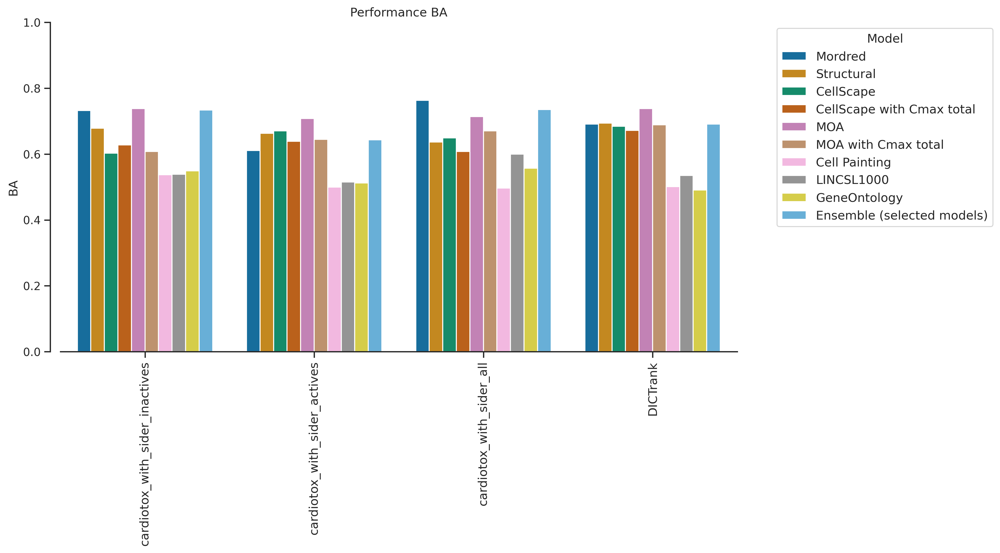

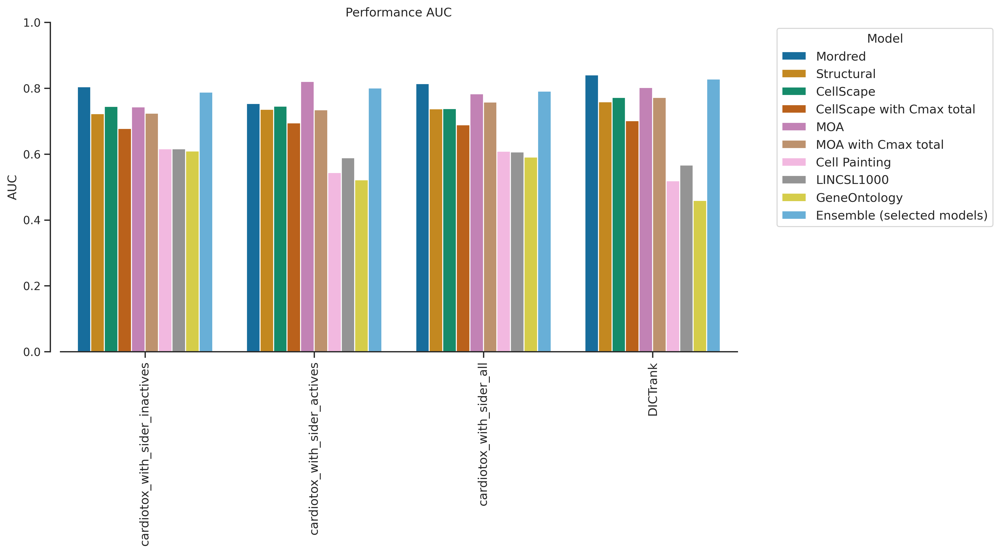

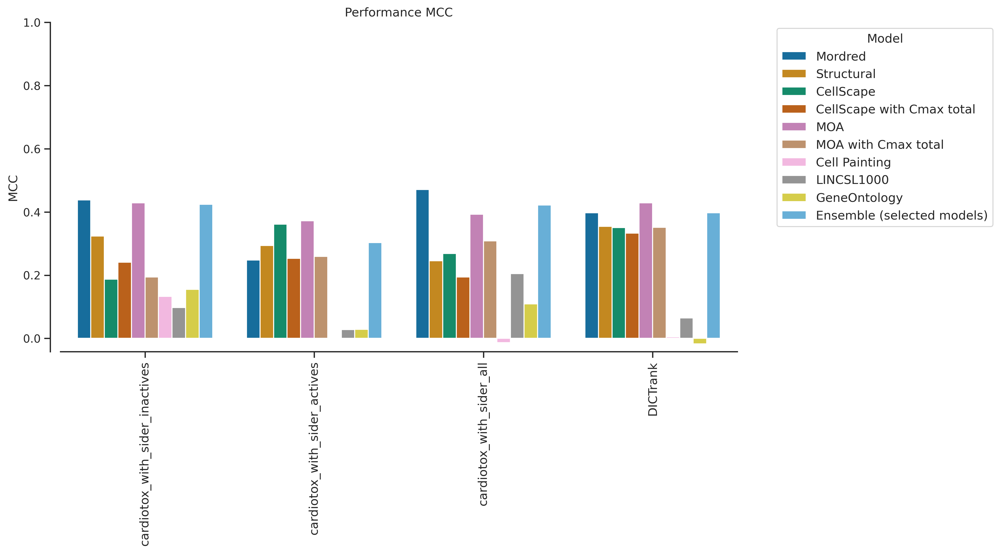

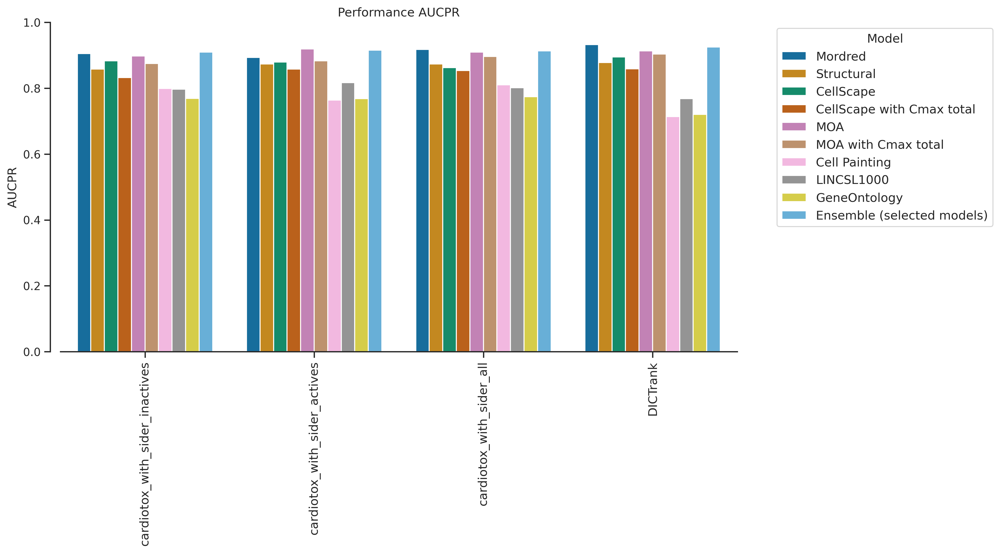

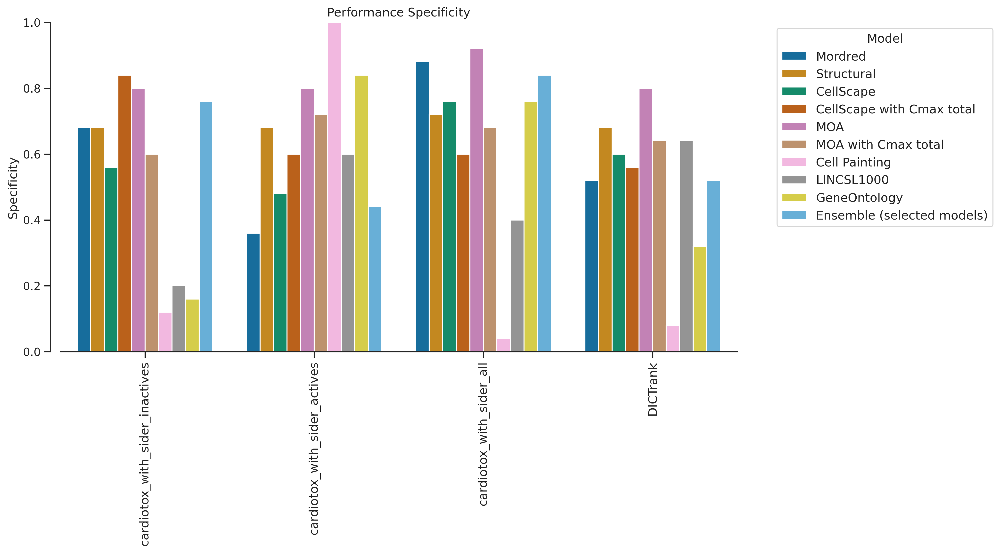

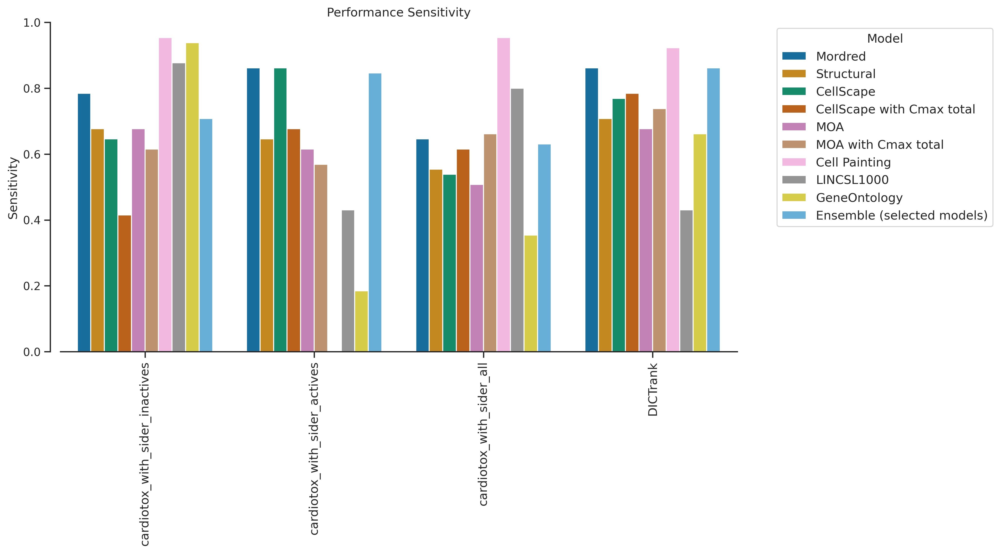

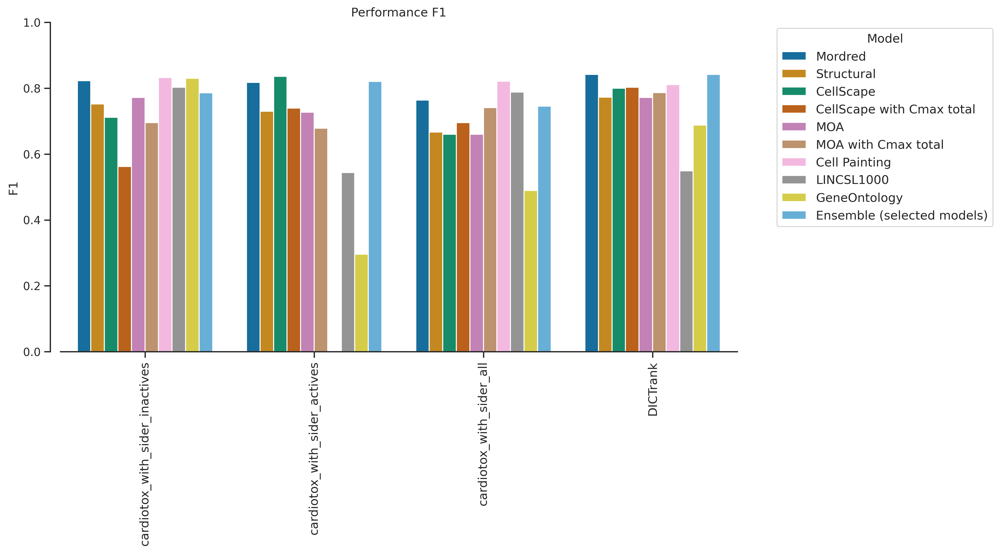

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the list of metrics to plot
metrics_to_plot = ['BA', 'AUC', 'MCC', 'AUCPR', 'Specificity', 'Sensitivity', "F1"]

# Set the width for grouped bars
width = 0.2

# Set a colorblind-friendly palette
colors = sns.color_palette("colorblind")

# Loop through each metric and create a grouped bar plot
for metric in metrics_to_plot:
    
    # Create a figure and axis using Seaborn
    plt.figure(figsize=(12, 6), dpi=300) 
    sns.set(style="white")  # Set the style

    metric_data = results_df[[f'phy_Held_out_{metric}', 
                              f'str_Held_out_{metric}', 
                              f'pid_Held_out_{metric}',
                              f'pid_cmt_Held_out_{metric}',
                              f'moa_Held_out_{metric}',
                              f'moa_cmt_Held_out_{metric}',
                              f'img_Held_out_{metric}',
                              f'ge_Held_out_{metric}',
                              f'go_Held_out_{metric}',
                              
                              f'esnemble_selected_Held_out_{metric}',
                              'Task']]
    
    metric_data.columns = ["Mordred", "Structural", "CellScape", "CellScape with Cmax total",
                           "MOA", "MOA with Cmax total",
                           "Cell Painting", "LINCSL1000", "GeneOntology",
                           "Ensemble (selected models)",  "Task"]

    # Melt the DataFrame to use 'hue' for differentiation
    melted_data = metric_data.reset_index().melt(id_vars='Task', 
                                            value_vars=["Mordred", 
                                                        "Structural", 
                                                        "CellScape", 
                                                        "CellScape with Cmax total",
                                                        "MOA", 
                                                        "MOA with Cmax total",
                                                        "Cell Painting", 
                                                        "LINCSL1000", 
                                                        "GeneOntology",
                                                        "Ensemble (selected models)"
                                                       ], 
                                            var_name='Metric', 
                                            value_name='Median Metric')
    # Create the grouped bar plot
    ax = sns.barplot(data=melted_data, x='Task', y='Median Metric', 
                hue='Metric', ci="sd", palette=colors, errcolor='black', 
                     errwidth=2, capsize=0.1) 
    

    # Set labels and title
    ax.set_ylabel(f'{metric}', fontsize=12)
    ax.set_title(f'Performance {metric}', fontsize=12)
    
    # Set x-axis ticks and labels with rotation, increased fontsize
    x_ticks = range(len(melted_data['Task'].unique()))
    x_labels = melted_data['Task'].unique()
    ax.set_xticklabels(x_labels, rotation=90, fontsize=12)  # Adjust rotation angle and fontsize

    # Add legend outside the box, on the upper right
    ax.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

    # Remove box line, set y-axis on the left, and add a line on the x-axis
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

    # Ensure the bars sit on the x-axis
    ax.set_ylim(top=1.0)
    
    # Remove x-axis label
    ax.set_xlabel('')

    # Show the plot
    plt.savefig(f'{metric}_barplot_comparison.png', bbox_inches='tight')
    plt.show()

In [38]:
metric_data.columns

Index(['Mordred', 'Structural', 'CellScape', 'CellScape with Cmax total',
       'MOA', 'MOA with Cmax total', 'Cell Painting', 'LINCSL1000',
       'GeneOntology', 'Ensemble (selected models)', 'Task'],
      dtype='object')

78 compounds only


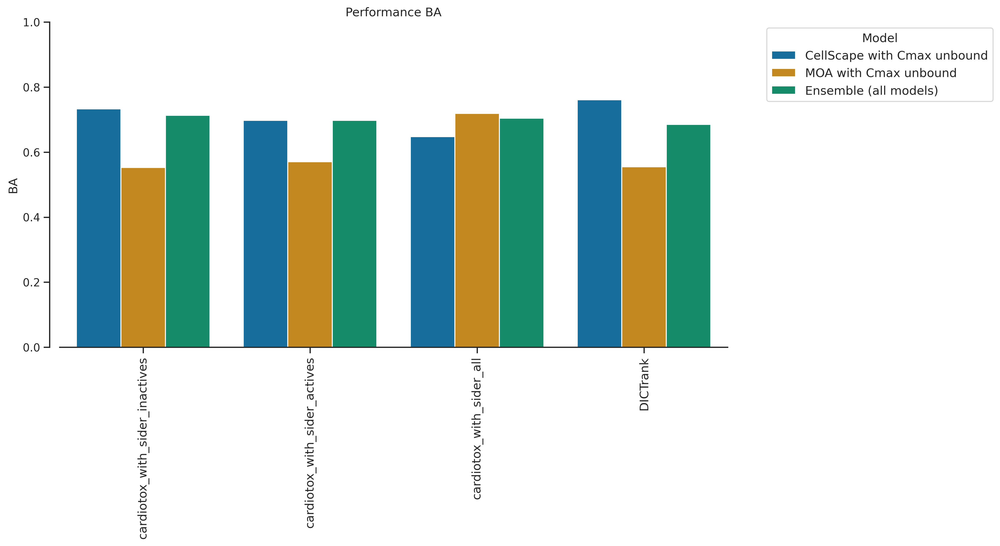

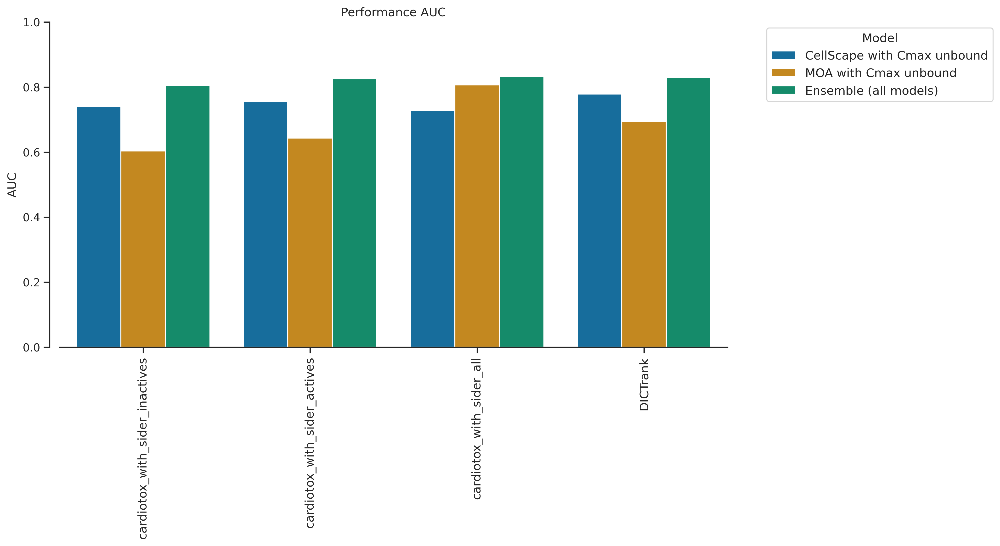

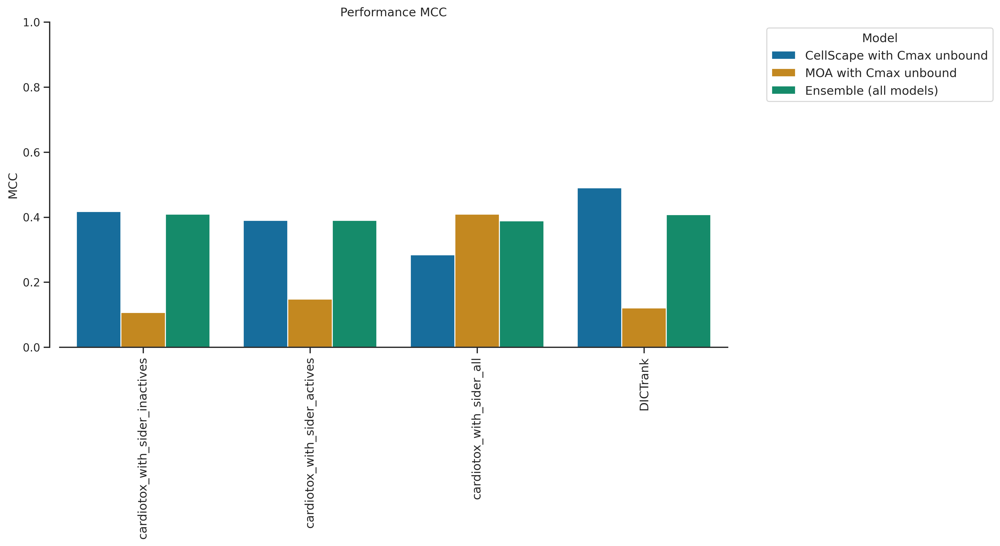

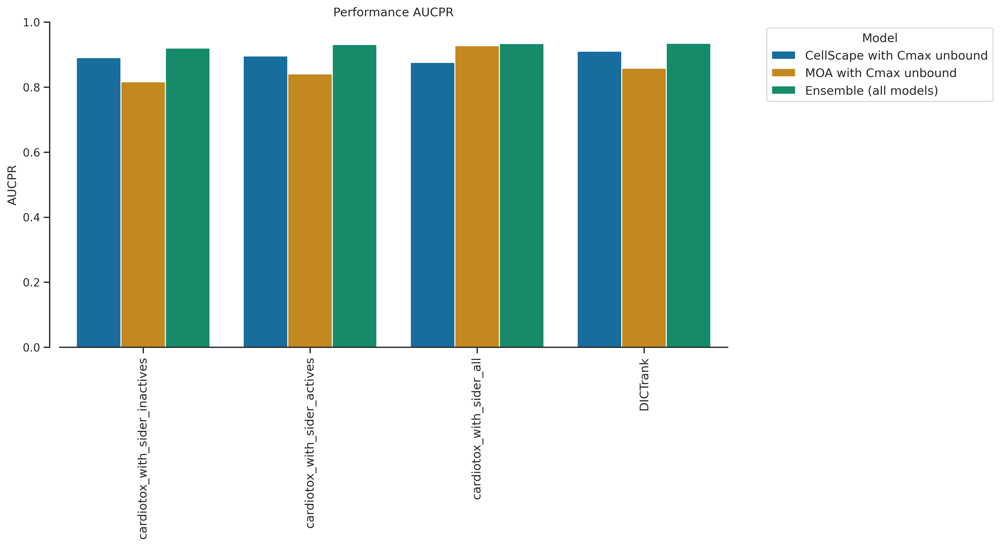

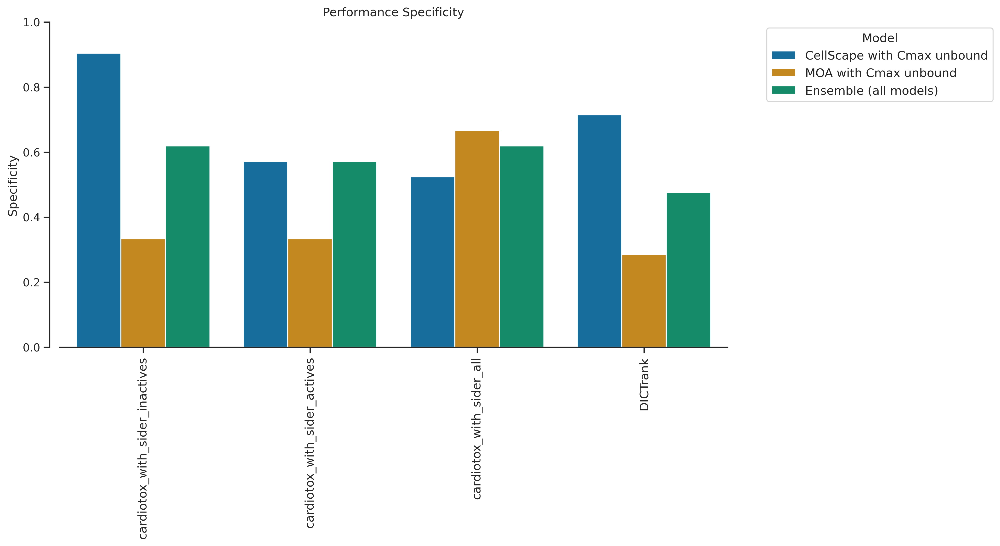

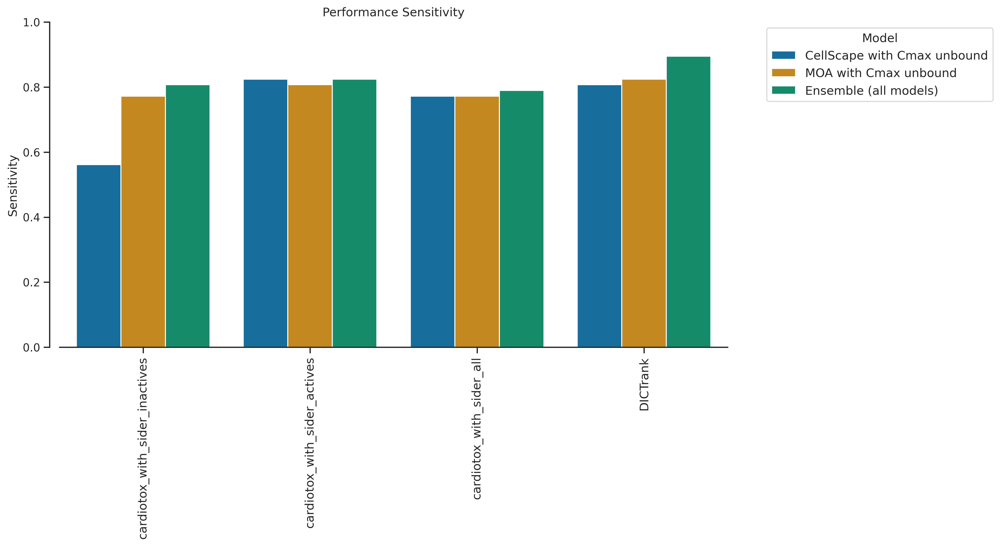

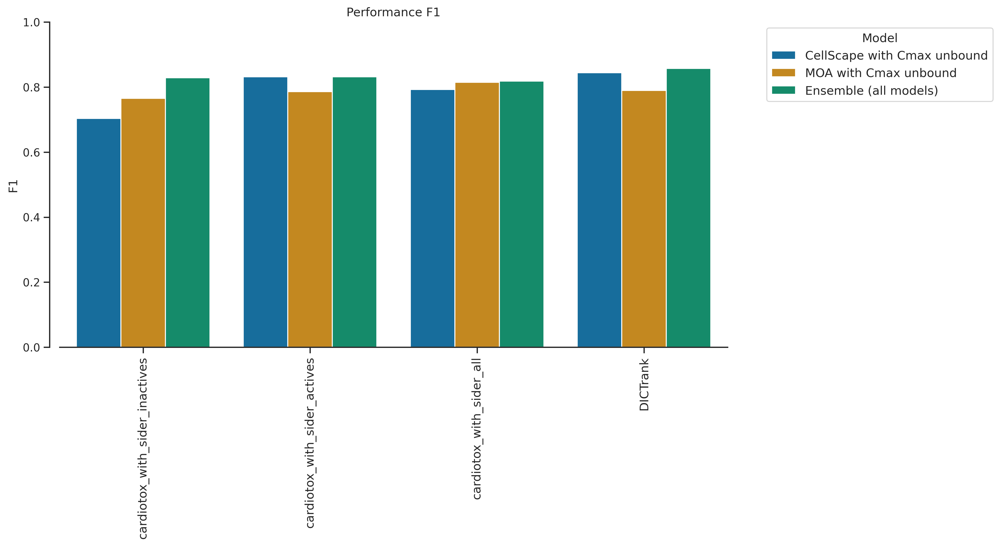

In [35]:
print("78 compounds only")

import matplotlib.pyplot as plt
import seaborn as sns

# Define the list of metrics to plot
metrics_to_plot = ['BA', 'AUC', 'MCC', 'AUCPR', 'Specificity', 'Sensitivity', "F1"]

# Set the width for grouped bars
width = 0.2

# Set a colorblind-friendly palette
colors = sns.color_palette("colorblind")

# Loop through each metric and create a grouped bar plot
for metric in metrics_to_plot:
    
    # Create a figure and axis using Seaborn
    plt.figure(figsize=(12, 6), dpi=300) 
    sns.set(style="white")  # Set the style

    metric_data = results_df[[f'pid_cmu_Held_out_{metric}',
                              f'moa_cmu_Held_out_{metric}',
                              f'esnemble_all_Held_out_{metric}',
                              'Task']]
    
    metric_data.columns = ["CellScape with Cmax unbound",
                           "MOA with Cmax unbound",
                           "Ensemble (all models)",
                           "Task"]

    # Melt the DataFrame to use 'hue' for differentiation
    melted_data = metric_data.reset_index().melt(id_vars='Task', 
                                            value_vars=['CellScape with Cmax unbound', 
                                                        'MOA with Cmax unbound',
                                                        'Ensemble (all models)'], 
                                            var_name='Metric', 
                                            value_name='Median Metric')
    # Create the grouped bar plot
    ax = sns.barplot(data=melted_data, x='Task', y='Median Metric', 
                hue='Metric', ci="sd", palette=colors, errcolor='black', 
                     errwidth=2, capsize=0.1) 
    

    # Set labels and title
    ax.set_ylabel(f'{metric}', fontsize=12)
    ax.set_title(f'Performance {metric}', fontsize=12)
    
    # Set x-axis ticks and labels with rotation, increased fontsize
    x_ticks = range(len(melted_data['Task'].unique()))
    x_labels = melted_data['Task'].unique()
    ax.set_xticklabels(x_labels, rotation=90, fontsize=12)  # Adjust rotation angle and fontsize

    # Add legend outside the box, on the upper right
    ax.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

    # Remove box line, set y-axis on the left, and add a line on the x-axis
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

    # Ensure the bars sit on the x-axis
    ax.set_ylim(top=1.0)
    
    # Remove x-axis label
    ax.set_xlabel('')

    # Show the plot
    plt.savefig(f'{metric}_barplot_comparison.png', bbox_inches='tight')
    plt.show()

78 compounds only


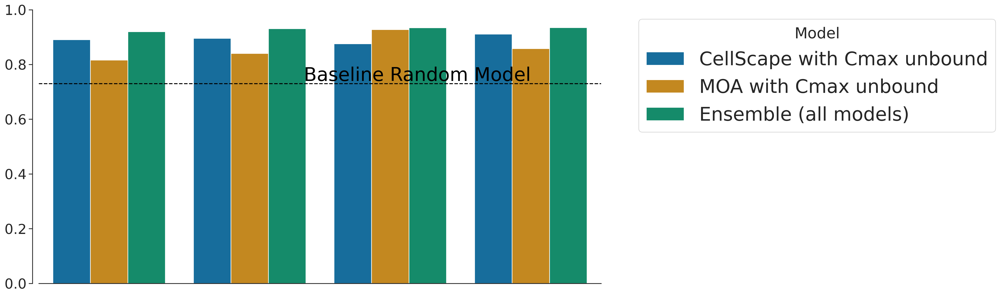

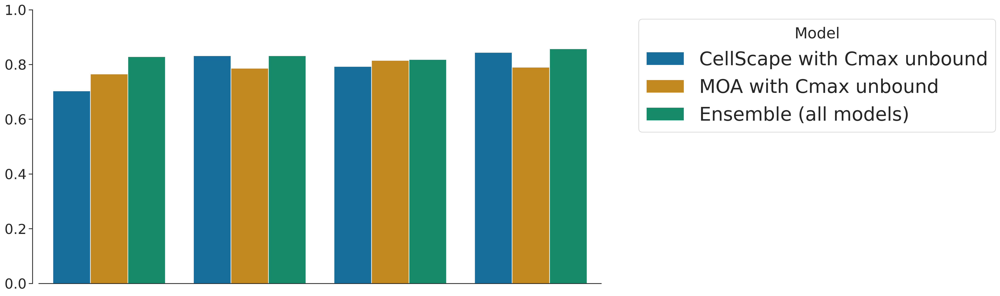

In [37]:
print("78 compounds only")

import matplotlib.pyplot as plt
import seaborn as sns

# Define the list of metrics to plot
metrics_to_plot = ['AUCPR', "F1"]

# Set the width for grouped bars
width = 0.2

# Set a colorblind-friendly palette
colors = sns.color_palette("colorblind")

# Loop through each metric and create a grouped bar plot
for metric in metrics_to_plot:
    
    # Create a figure and axis using Seaborn
    plt.figure(figsize=(16, 8), dpi=300) 
    sns.set(style="white", font_scale=2) # Set the style
    
    metric_data = results_df[[f'pid_cmu_Held_out_{metric}',
                              f'moa_cmu_Held_out_{metric}',
                              f'esnemble_all_Held_out_{metric}',
                              'Task']]
    
    metric_data.columns = ["CellScape with Cmax unbound",
                           "MOA with Cmax unbound",
                           "Ensemble (all models)",
                           "Task"]

    # Melt the DataFrame to use 'hue' for differentiation
    melted_data = metric_data.reset_index().melt(id_vars='Task', 
                                            value_vars=['CellScape with Cmax unbound', 
                                                        'MOA with Cmax unbound',
                                                        'Ensemble (all models)'], 
                                            var_name='Metric', 
                                            value_name='Median Metric')
    # Create the grouped bar plot
    ax = sns.barplot(data=melted_data, x='Task', y='Median Metric', 
                hue='Metric', ci="sd", palette=colors, errcolor='black', 
                     errwidth=2, capsize=0.1) 
    

    
    if (metric == "AUCPR"):     
        # Insert a dashed line at y=0.72
        ax.axhline(0.73, color='black', linestyle='--')

        # Add a label on top of the dashed line
        x_max = melted_data['Task'].nunique() - 1  # This assumes equally spaced x-ticks
        ax.text(x_max, 0.72 + 0.02, 'Baseline Random Model', horizontalalignment='right', 
                color='black', 
                fontsize=30)


    # Set labels and title
    #ax.set_ylabel(f'{metric}', fontsize=30)
    #ax.set_title(f'Performance {metric}', fontsize=30)
    
    # Set x-axis ticks and labels with rotation, increased fontsize
    #x_ticks = range(len(melted_data['Task'].unique()))
    #x_labels = melted_data['Task'].unique()
    #ax.set_xticklabels(x_labels, rotation=90, fontsize=30)  # Adjust rotation angle and fontsize
    #ax.tick_params(axis='y', labelsize=30)
    ax.set_xticks([])
    
    # Add legend outside the box, on the upper right
    ax.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=30)

    # Remove box line, set y-axis on the left, and add a line on the x-axis
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

    # Ensure the bars sit on the x-axis
    ax.set_ylim(top=1.0)
    
    # Remove x-axis label
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Show the plot
    plt.show()

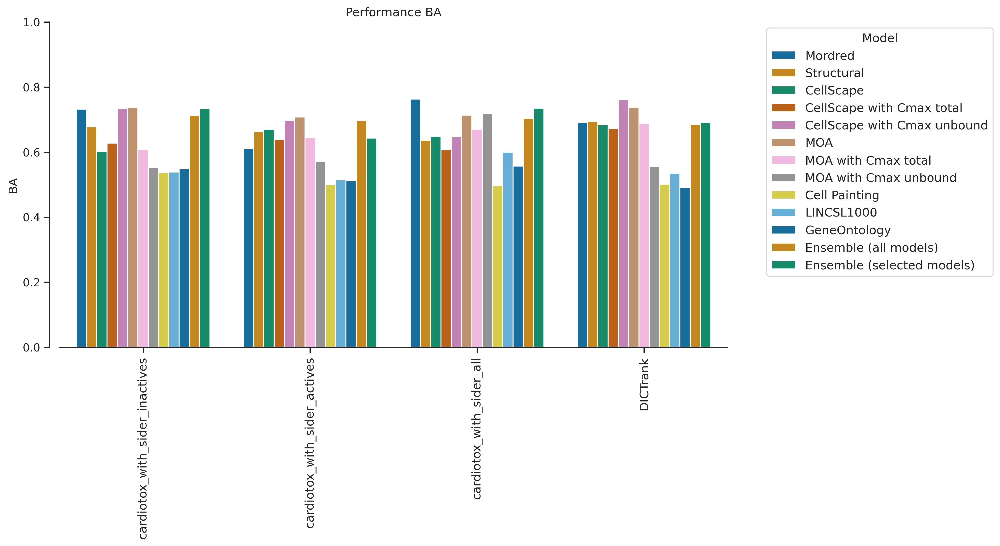

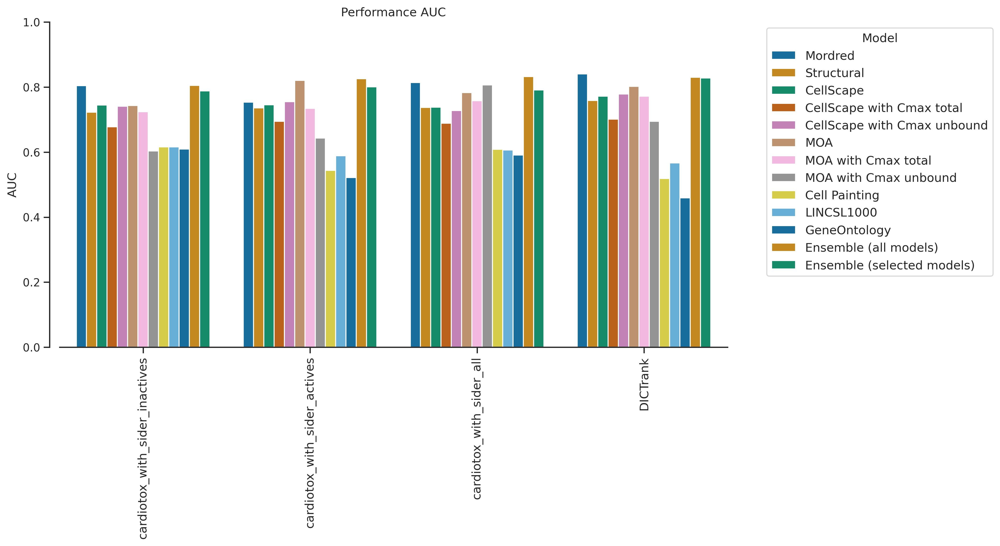

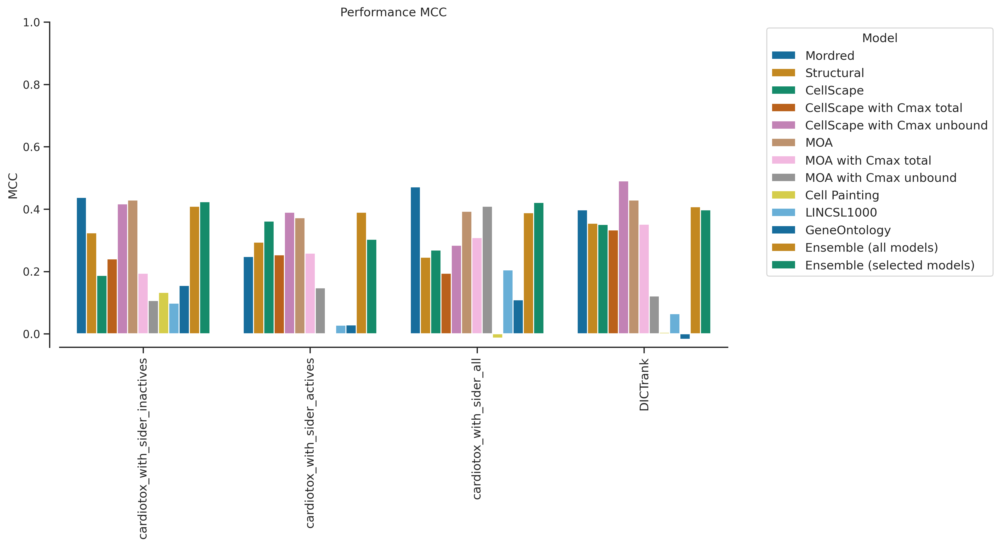

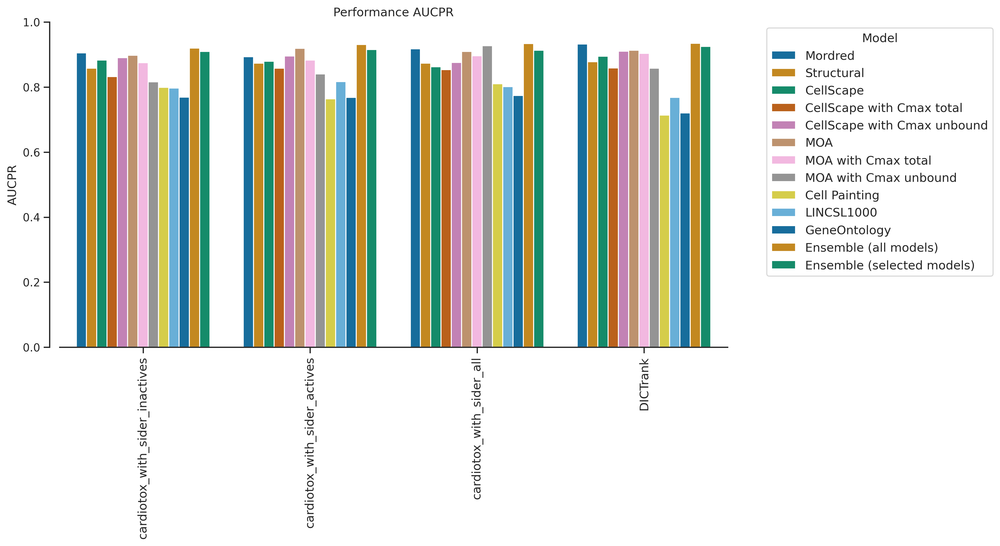

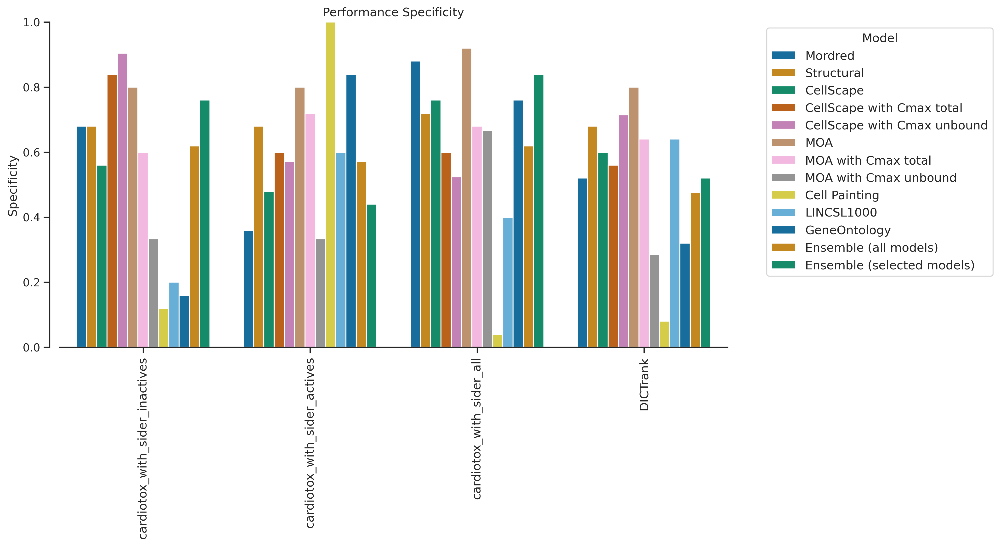

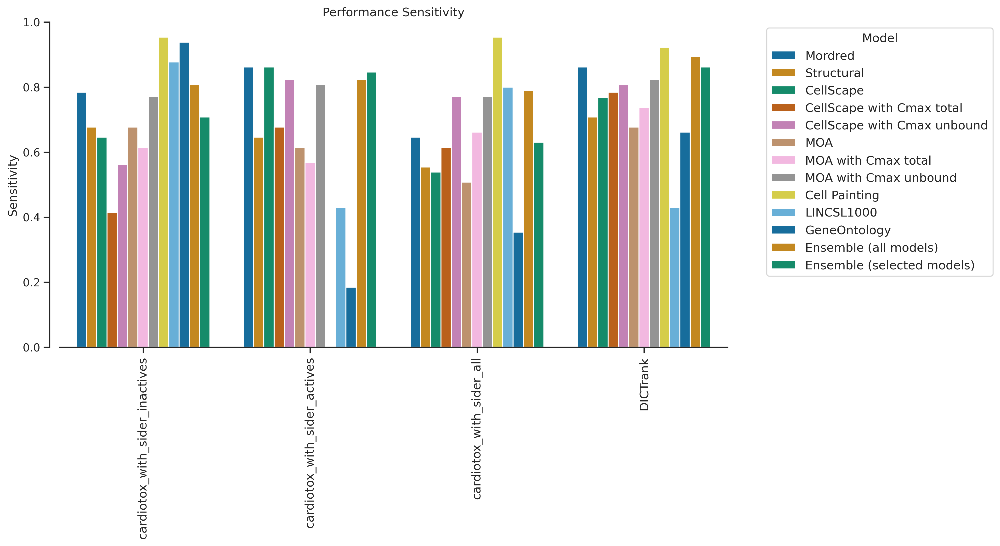

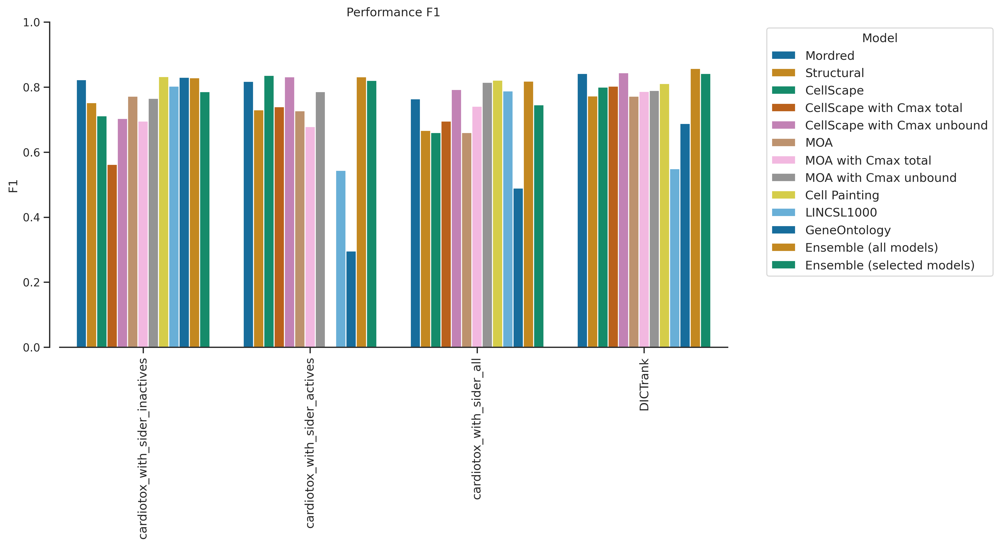

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the list of metrics to plot
metrics_to_plot = ['BA', 'AUC', 'MCC', 'AUCPR', 'Specificity', 'Sensitivity', "F1"]

# Set the width for grouped bars
width = 0.2

# Set a colorblind-friendly palette
colors = sns.color_palette("colorblind")

# Loop through each metric and create a grouped bar plot
for metric in metrics_to_plot:
    
    # Create a figure and axis using Seaborn
    plt.figure(figsize=(12, 6), dpi=300) 
    sns.set(style="white")  # Set the style

    metric_data = results_df[[f'phy_Held_out_{metric}', 
                              f'str_Held_out_{metric}', 
                              f'pid_Held_out_{metric}',
                              f'pid_cmt_Held_out_{metric}',
                              f'pid_cmu_Held_out_{metric}',
                              f'moa_Held_out_{metric}',
                              f'moa_cmt_Held_out_{metric}',
                              f'moa_cmu_Held_out_{metric}',
                              f'img_Held_out_{metric}',
                              f'ge_Held_out_{metric}',
                              f'go_Held_out_{metric}',
                              f'esnemble_all_Held_out_{metric}',
                              f'esnemble_selected_Held_out_{metric}',
                              'Task']]
    
    metric_data.columns = ["Mordred", "Structural", "CellScape", "CellScape with Cmax total","CellScape with Cmax unbound",
                           "MOA","MOA with Cmax total","MOA with Cmax unbound",
                           "Cell Painting", "LINCSL1000", "GeneOntology","Ensemble (all models)",
                           "Ensemble (selected models)",  "Task"]

    # Melt the DataFrame to use 'hue' for differentiation
    melted_data = metric_data.reset_index().melt(id_vars='Task', 
                                            value_vars=["Mordred", 
                                                        "Structural",
                                                        "CellScape", 
                                                        "CellScape with Cmax total",
                                                        "CellScape with Cmax unbound",
                                                        "MOA",
                                                        "MOA with Cmax total",
                                                        "MOA with Cmax unbound",
                                                        "Cell Painting", 
                                                        "LINCSL1000", 
                                                        "GeneOntology",
                                                       "Ensemble (all models)",
                                                        "Ensemble (selected models)"], 
                                            var_name='Metric', 
                                            value_name='Median Metric')
    # Create the grouped bar plot
    ax = sns.barplot(data=melted_data, x='Task', y='Median Metric', 
                hue='Metric', ci="sd", palette=colors, errcolor='black', 
                     errwidth=2, capsize=0.1) 
    

    # Set labels and title
    ax.set_ylabel(f'{metric}', fontsize=12)
    ax.set_title(f'Performance {metric}', fontsize=12)
    
    # Set x-axis ticks and labels with rotation, increased fontsize
    x_ticks = range(len(melted_data['Task'].unique()))
    x_labels = melted_data['Task'].unique()
    ax.set_xticklabels(x_labels, rotation=90, fontsize=12)  # Adjust rotation angle and fontsize

    # Add legend outside the box, on the upper right
    ax.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

    # Remove box line, set y-axis on the left, and add a line on the x-axis
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

    # Ensure the bars sit on the x-axis
    ax.set_ylim(top=1.0)
    
    # Remove x-axis label
    ax.set_xlabel('')

    # Show the plot
    plt.savefig(f'{metric}_barplot_comparison.png', bbox_inches='tight')
    plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the list of metrics to plot
metrics_to_plot = ['BA', 'AUC', 'MCC', 'AUCPR', 'Specificity', 'Sensitivity', '"F1_score"']

# Set the width for grouped bars
width = 0.2

# Set a colorblind-friendly palette
colors = sns.color_palette("colorblind")

# Loop through each metric and create a grouped bar plot
for metric in metrics_to_plot:
    
    # Create a figure and axis using Seaborn
    plt.figure(figsize=(8, 6), dpi=300) 
    sns.set(style="white")  # Set the style

    metric_data = results_df[[f'str_Held_out_{metric}', 'Task']]
    
    metric_data.columns = ["Structural", "Task"]

    # Melt the DataFrame to use 'hue' for differentiation
    melted_data = metric_data.reset_index().melt(id_vars='Task', 
                                            value_vars=["Structural"], 
                                            var_name='Metric', 
                                            value_name='Median Metric')
    # Create the grouped bar plot
    ax = sns.barplot(data=melted_data, x='Task', y='Median Metric', 
                hue='Metric', ci="sd", palette=colors, errcolor='black', 
                     errwidth=2, capsize=0.1) 
    

    # Set labels and title
    ax.set_ylabel(f'{metric}', fontsize=12)
    ax.set_title(f'Performance {metric}', fontsize=12)
    
    # Set x-axis ticks and labels with rotation, increased fontsize
    x_ticks = range(len(melted_data['Task'].unique()))
    x_labels = melted_data['Task'].unique()
    ax.set_xticklabels(x_labels, rotation=90, fontsize=12)  # Adjust rotation angle and fontsize

    # Add legend outside the box, on the upper right
    ax.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

    # Remove box line, set y-axis on the left, and add a line on the x-axis
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

    # Ensure the bars sit on the x-axis
    ax.set_ylim(top=1.0)
    
    # Remove x-axis label
    ax.set_xlabel('')

    # Show the plot
    plt.savefig(f'{metric}_barplot_comparison.png', bbox_inches='tight')
    plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define the list of metrics to plot
metrics_to_plot = ['BA', 'AUC', 'AUCPR']

# Loop through each metric and create correlation plots for each
for metric in metrics_to_plot:

    # Create a correlation plot to compare endpoints in img vs. str space
    plt.figure(figsize=(10, 10), dpi=300)
    sns.set_style("whitegrid")

    # Scatterplot
    scatter = sns.scatterplot(
        data=results_df,
        x=f'phy_Held_out_{metric}',
        y=f'str_Held_out_{metric}',
        hue='Task',
        s=20,
        palette='colorblind',  # Adjust the color palette as desired
    )

    # Add a diagonal line (x=y)
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', linewidth=1)

    # Set x and y axis limits to start from 0 to 1
    plt.xlim(0, 1)
    plt.ylim(0, 1)

    # Remove the box
    sns.despine()


    plt.xlabel('Mordred Models', fontsize=12)
    plt.ylabel('Structural Models', fontsize=12)

    plt.title(f'Comparison of Endpoint Prediction with {metric}', fontsize=12)

    plt.legend(title='Task', title_fontsize=10, fontsize=8, loc='upper left')
    
    plt.savefig(f'{metric}_scatter_comparison.png', bbox_inches='tight')  
    plt.show()

In [ ]:
results_df.T.reset_index().index.contains("Held_out_AUCPR")